In [2]:
import xarray as xr
import datetime as dt
import pandas as pd
from tqdm import tqdm
from glob import glob
from braceexpand import braceexpand
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import matplotlib
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
from scipy.stats import linregress
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..', 'POSTPROCESSING')))
from ETC_tools import open_files, calculate_ranking

In [14]:
sim = 'UBB'

if sim == 'UBB':
    endyear = 2023
else:
    endyear = 2014

In [15]:
def braced_glob(path):
    l = []
    for x in braceexpand(path):
        l.extend(glob(x))          
    return l

In [16]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)
    Possible and slightly more precise with geopy or pyproj through xr.apply_ufunc but longer
    """
    # convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    # haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

In [17]:
quantile = 0.999

df, _ = open_files(sim, future=False, ref=False)

In [18]:
(
    sorted_EETC_cum_rank,
    sorted_EETC_cum_avg_rank,
    sorted_EETC_cum_SSI_rank,
    sorted_EETC_cum_avg_SSI_rank,
    _,
    _,
    _,
    _,
    EETC_dict,
    _
) = calculate_ranking(sim=sim, quantile=quantile, ref=False, method='product')

In [7]:
#standby pour le monoplot, à décommenter pour le multiplot
# for storm in EETC_dict:
#     if EETC_dict[storm]['cum_precip'].sel(quantile=quantile).values or EETC_dict[storm]['cum_avg_precip'].sel(quantile=quantile).values or EETC_dict[storm]['cum_wind'].sel(quantile=quantile).values or EETC_dict[storm]['cum_avg_wind'].sel(quantile=quantile).values or EETC_dict[storm]['SSI'].sel(quantile=quantile).values != 0:
#         storm_group = df.groupby('storm').get_group(storm)
#         min_pressure_row = storm_group.loc[storm_group['pressure'].idxmin()]
#         EETC_dict[storm]['min_pressure_date'] = min_pressure_row['date']

## Préparation au tracé des cartes

In [19]:
positions = [
    [0.05, 0.45, 0.29, 0.50],  # Rangée du haut, Colonne 1
    [0.35, 0.45, 0.29, 0.50],  # Rangée du haut, Colonne 2
    [0.65, 0.45, 0.29, 0.50],  # Rangée du haut, Colonne 3
    [0.05, 0.11, 0.29, 0.50],  # Rangée du bas,  Colonne 1
    [0.35, 0.11, 0.29, 0.50],  # Rangée du bas,  Colonne 2
    [0.65, 0.11, 0.29, 0.50],  # Rangée du bas,  Colonne 3
]

percentile_precip = xr.open_mfdataset(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR_Percentile/pr_{sim.lower()}_percentile.nc')
percentile_precip['pr'] = percentile_precip.pr * 3600.

percentile_wind = xr.open_mfdataset(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND_Percentile/surf_wind_{sim.lower()}_percentile.nc')
percentile_wind = percentile_wind * 3.6

for_pole = xr.open_dataset('/home/vdemeyer/projects/rrg-gachon/vdemeyer/UBB/PR/pr_ubb_202001_se.nc')
pole_lon = for_pole.rotated_pole.attrs['grid_north_pole_longitude']
pole_lat = for_pole.rotated_pole.attrs['grid_north_pole_latitude']
polecrs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)

west_longitude = -80
east_longitude = -66
north_latitude = 55
south_latitude = 44

mask = (
    (percentile_precip.lon >= west_longitude) &
    (percentile_precip.lon <= east_longitude) &
    (percentile_precip.lat >= south_latitude) &
    (percentile_precip.lat <= north_latitude)
)

Mask_NNA = xr.DataArray(
    np.zeros((len(percentile_precip['rlat']), len(percentile_precip['rlon']))),
    coords={'rlat': percentile_precip['rlat'], 'rlon': percentile_precip['rlon']},
    dims=['rlat', 'rlon']
)

Mask_NNA = xr.where(mask, 1, Mask_NNA)

# Strongest storm

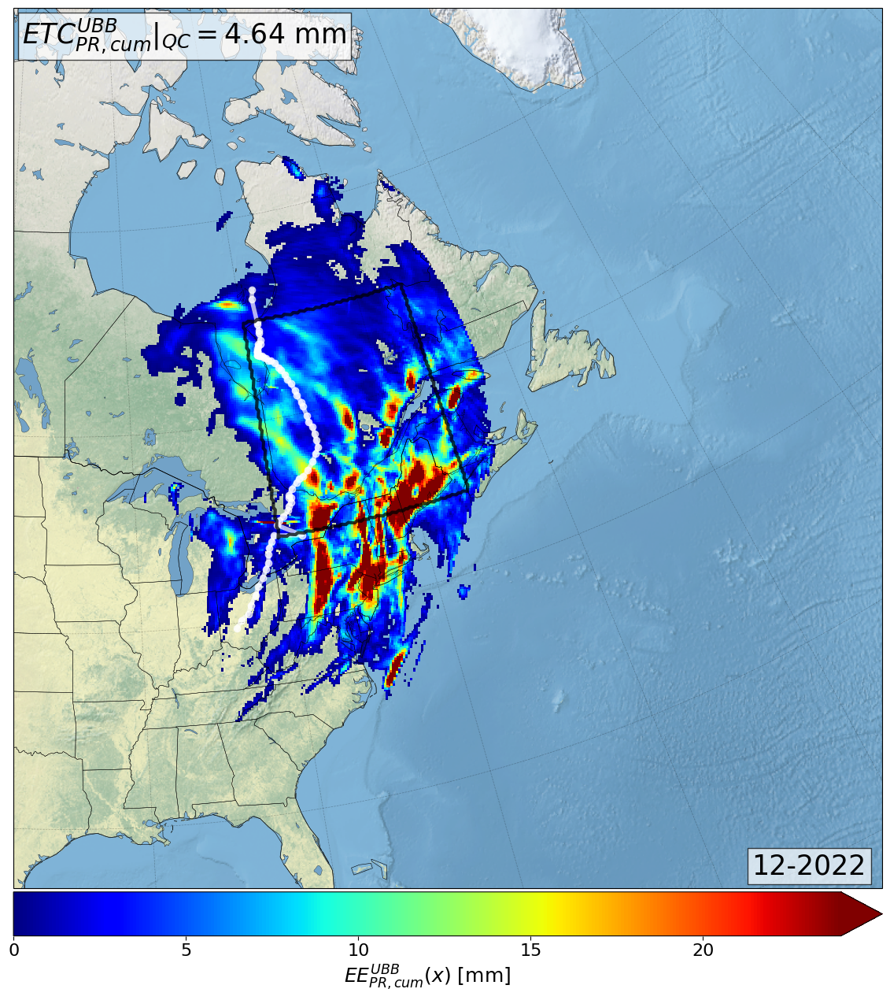

In [17]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5, 12.5), tight_layout = {'pad': 0})

max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_rank[0])

min_pressure_row = max_EETC.loc[max_EETC['pressure'].idxmin()]
EETC_dict[sorted_EETC_cum_rank[0]]['min_pressure_date'] = min_pressure_row['date']

month_years = max_EETC['date'].dt.to_period('M').unique()
filenames = []
for period in month_years:
    year = period.year
    month = period.month
    filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR/pr_{sim.lower()}_{year}{month:02d}_se.nc'))
ds = xr.open_mfdataset(filenames)
ds['time'] = ds['time'].dt.floor('h') #round pour wind
ds['pr'] = ds.pr * 3600.
mask_diff_precip = ds - percentile_precip
mask_diff_precip = mask_diff_precip.where(mask_diff_precip >= 0, np.nan)
mask_diff_precip = mask_diff_precip.compute()

iEETC_list_precip = []
for itrack, row in max_EETC.iterrows():        
    ilon, ilat, itime = row['lon'], row['lat'], row['date']

    mask_itime_precip = mask_diff_precip.sel(time=itime).where(mask_diff_precip.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).pr

    iEETC_list_precip.append(mask_itime_precip.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

iEETC_precip = xr.concat(iEETC_list_precip, dim='time') 
iEETC_precip_exc = iEETC_precip.sum(dim=['time']) 

ax.set_extent([-98, -47, 65, 27], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

vmin = 0
vmax = 24
cmap = plt.get_cmap('jet')

ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=4, c='white', alpha=0.7, marker='o', markersize=6)

iEETC_precip_exc = iEETC_precip_exc.where(iEETC_precip_exc > 0, np.nan)

# sc = ax.contourf(iEETC_precip_exc['longitude'], iEETC_precip_exc['latitude'],
#                  iEETC_precip_exc.sel(quantile=0.999), levels=np.linspace(vmin, vmax, int((vmax-vmin)/2)+1), extend='max', cmap=cmap, transform=ccrs.PlateCarree())

sc = ax.pcolormesh(iEETC_precip_exc['rlon'], iEETC_precip_exc['rlat'],
             iEETC_precip_exc.sel(quantile=quantile), vmin=vmin, vmax=vmax, cmap=cmap, transform=polecrs)

ax.contour(
    Mask_NNA['rlon'],
    Mask_NNA['rlat'],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=polecrs,
)

ax.text(
    0.01, 0.99,
    r"$ETC_{PR,cum}^{UBB}|_{QC} = $"f"{np.round(EETC_dict[sorted_EETC_cum_rank[0]]['cum_precip'].sel(quantile=quantile).values.item(), 2)} mm",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.text(
    0.85, 0.04,
    f"{EETC_dict[sorted_EETC_cum_rank[0]]['min_pressure_date'].month}-{EETC_dict[sorted_EETC_cum_rank[0]]['min_pressure_date'].year}",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

 
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cbar.set_label(r'$EE_{PR,cum}^{UBB}(x)$ [mm]', fontsize=18)
cbar.ax.tick_params(labelsize=16)

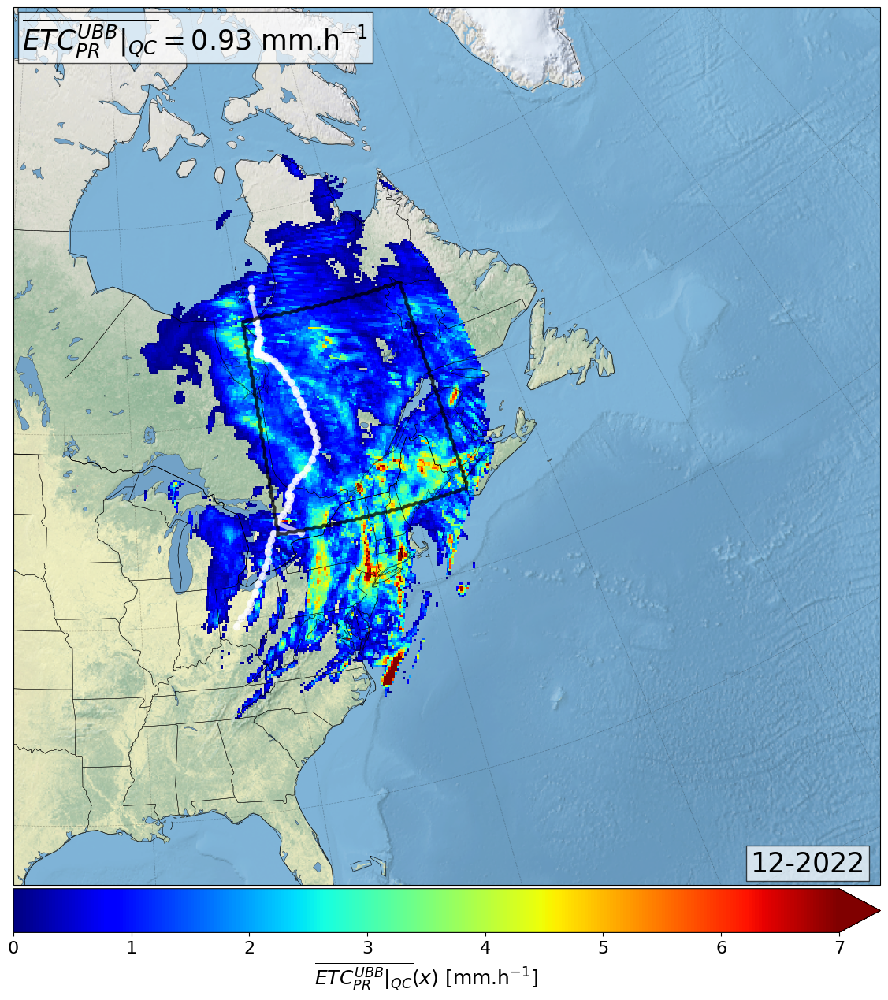

In [21]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5, 12.5), tight_layout = {'pad': 0})


max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_avg_rank[0])

min_pressure_row = max_EETC.loc[max_EETC['pressure'].idxmin()]
EETC_dict[sorted_EETC_cum_avg_rank[0]]['min_pressure_date'] = min_pressure_row['date']


month_years = max_EETC['date'].dt.to_period('M').unique()
filenames = []
for period in month_years:
    year = period.year
    month = period.month
    filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR/pr_{sim.lower()}_{year}{month:02d}_se.nc'))
ds = xr.open_mfdataset(filenames)
ds['time'] = ds['time'].dt.floor('h')
ds['pr'] = ds.pr * 3600.
mask_diff_precip = ds - percentile_precip
mask_diff_precip = mask_diff_precip.where(mask_diff_precip >= 0, np.nan)

iEETC_list_precip = []
for itrack, row in max_EETC.iterrows():        
    ilon, ilat, itime = row['lon'], row['lat'], row['date']

    mask_itime_precip = mask_diff_precip.sel(time=itime).where(mask_diff_precip.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).pr

    iEETC_list_precip.append(mask_itime_precip.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

iEETC_precip = xr.concat(iEETC_list_precip, dim='time') 
iEETC_precip_exc = iEETC_precip.sum(dim=['time'])
iEETC_precip_dur = iEETC_precip.where(iEETC_precip > 0).count(dim='time')
iEETC_precip_avexc = iEETC_precip_exc / iEETC_precip_dur.where(iEETC_precip_dur != 0)

ax.set_extent([-98, -47, 65, 27], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

vmin = 0
vmax = 7
cmap = plt.get_cmap('jet')

ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=4, c='white', alpha=0.7, marker='o', markersize=6)

iEETC_precip_avexc = iEETC_precip_avexc.where(iEETC_precip_avexc > 0, np.nan)

# sc = ax.contourf(iEETC_precip_avexc['rlon'], iEETC_precip_avexc['rlat'],
#                  iEETC_precip_avexc.sel(quantile=0.99), levels=np.linspace(vmin, vmax, int((vmax-vmin)*1)+1), extend='max', cmap=cmap, transform=polecrs)

sc = ax.pcolormesh(iEETC_precip_avexc['rlon'], iEETC_precip_avexc['rlat'],
             iEETC_precip_avexc.sel(quantile=quantile), vmin=vmin, vmax=vmax, cmap=cmap, transform=polecrs)

ax.contour(
    Mask_NNA['rlon'],
    Mask_NNA['rlat'],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=polecrs,
)


ax.text(
    0.01, 0.99,
    r"$\overline{ETC_{PR}^{UBB}|_{QC}} = $"f"{np.round(EETC_dict[sorted_EETC_cum_avg_rank[0]]['cum_avg_precip'].sel(quantile=quantile).values.item(), 2)} "r"mm.h$^{-1}$",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.text(
    0.85, 0.04,
    f"{EETC_dict[sorted_EETC_cum_avg_rank[0]]['min_pressure_date'].month}-{EETC_dict[sorted_EETC_cum_avg_rank[0]]['min_pressure_date'].year}",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)


divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cbar.set_label(r"$\overline{ETC_{PR}^{UBB}|_{QC}}(x)$ [mm.h$^{-1}$]", fontsize=18)
cbar.ax.tick_params(labelsize=16)

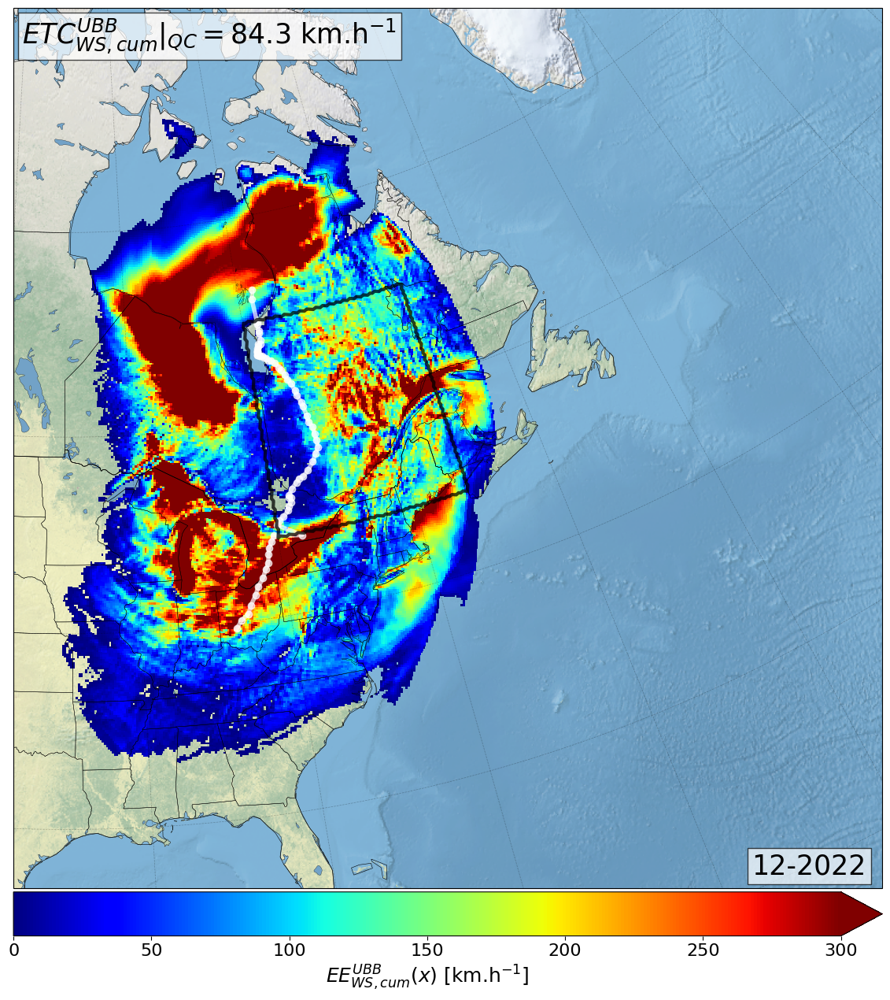

In [25]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5, 12.5), tight_layout = {'pad': 0})

max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_rank[0])

min_pressure_row = max_EETC.loc[max_EETC['pressure'].idxmin()]
EETC_dict[sorted_EETC_cum_rank[0]]['min_pressure_date'] = min_pressure_row['date']

month_years = max_EETC['date'].dt.to_period('M').unique()
filenames = []
for period in month_years:
    year = period.year
    month = period.month
    filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND/wind10_{sim.lower()}_{year}{month:02d}_se.nc'))
ds = xr.open_mfdataset(filenames)
ds['time'] = ds['time'].dt.round('h')
ds['surf_wind'] = ds.surf_wind * 3.6
mask_diff_wind = ds - percentile_wind
mask_diff_wind = mask_diff_wind.where(mask_diff_wind >= 0, np.nan)

iEETC_list_wind = []
for itrack, row in max_EETC.iterrows():        
    ilon, ilat, itime = row['lon'], row['lat'], row['date']

    mask_itime_wind = mask_diff_wind.sel(time=itime).where(mask_diff_wind.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).surf_wind

    iEETC_list_wind.append(mask_itime_wind.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

iEETC_wind = xr.concat(iEETC_list_wind, dim='time') 
iEETC_wind_exc = iEETC_wind.sum(dim=['time']) 

ax.set_extent([-98, -47, 65, 27], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

vmin = 0
vmax = 300
cmap = plt.get_cmap('jet')

ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=4, c='white', alpha=0.7, marker='o', markersize=6)

iEETC_wind_exc = iEETC_wind_exc.where(iEETC_wind_exc > 0, np.nan)

# sc = ax.contourf(iEETC_wind_exc['longitude'], iEETC_wind_exc['latitude'],
#                  iEETC_wind_exc.sel(quantile=0.999), levels=np.linspace(vmin, vmax, int((vmax-vmin)/2)+1), extend='max', cmap=cmap, transform=ccrs.PlateCarree())

sc = ax.pcolormesh(iEETC_wind_exc['rlon'], iEETC_wind_exc['rlat'],
             iEETC_wind_exc.sel(quantile=quantile), vmin=vmin, vmax=vmax, cmap=cmap, transform=polecrs)

ax.contour(
    Mask_NNA['rlon'],
    Mask_NNA['rlat'],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=polecrs,
)

ax.text(
    0.01, 0.99,
    r"$ETC_{WS,cum}^{UBB}|_{QC} = $"f"{np.round(EETC_dict[sorted_EETC_cum_rank[0]]['cum_wind'].sel(quantile=quantile).values.item(), 2)} "r"km.h$^{-1}$",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.text(
    0.85, 0.04,
    f"{EETC_dict[sorted_EETC_cum_rank[0]]['min_pressure_date'].month}-{EETC_dict[sorted_EETC_cum_rank[0]]['min_pressure_date'].year}",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

 
divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cbar.set_label(r'$EE_{WS,cum}^{UBB}(x)$ [km.h$^{-1}$]', fontsize=18)
cbar.ax.tick_params(labelsize=16)

In [ ]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5, 12.5), tight_layout = {'pad': 0})


max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_avg_rank[0])

min_pressure_row = max_EETC.loc[max_EETC['pressure'].idxmin()]
EETC_dict[sorted_EETC_cum_avg_rank[0]]['min_pressure_date'] = min_pressure_row['date']


month_years = max_EETC['date'].dt.to_period('M').unique()
filenames = []
for period in month_years:
    year = period.year
    month = period.month
    filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND/wind10_{sim.lower()}_{year}{month:02d}_se.nc'))
ds = xr.open_mfdataset(filenames)
ds['time'] = ds['time'].dt.round('h')
ds['surf_wind'] = ds.surf_wind * 3.6
mask_diff_wind = ds - percentile_wind
mask_diff_wind = mask_diff_wind.where(mask_diff_wind >= 0, np.nan)

iEETC_list_wind = []
for itrack, row in max_EETC.iterrows():        
    ilon, ilat, itime = row['lon'], row['lat'], row['date']

    mask_itime_wind = mask_diff_wind.sel(time=itime).where(mask_diff_wind.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).surf_wind

    iEETC_list_wind.append(mask_itime_wind.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

iEETC_wind = xr.concat(iEETC_list_wind, dim='time') 
iEETC_wind_exc = iEETC_wind.sum(dim=['time'])
iEETC_wind_dur = iEETC_wind.where(iEETC_wind > 0).count(dim='time')    
iEETC_wind_avexc = iEETC_wind_exc / iEETC_wind_dur.where(iEETC_wind_dur != 0)

ax.set_extent([-98, -47, 65, 27], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

vmin = 0
vmax = 10
cmap = plt.get_cmap('jet')

ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=4, c='white', alpha=0.7, marker='o', markersize=6)

iEETC_wind_avexc = iEETC_wind_avexc.where(iEETC_wind_avexc > 0, np.nan)

# sc = ax.contourf(iEETC_wind_avexc['rlon'], iEETC_wind_avexc['rlat'],
#                  iEETC_wind_avexc.sel(quantile=0.99), levels=np.linspace(vmin, vmax, int((vmax-vmin)*1)+1), extend='max', cmap=cmap, transform=polecrs)

sc = ax.pcolormesh(iEETC_wind_avexc['rlon'], iEETC_wind_avexc['rlat'],
             iEETC_wind_avexc.sel(quantile=quantile), vmin=vmin, vmax=vmax, cmap=cmap, transform=polecrs)

ax.contour(
    Mask_NNA['rlon'],
    Mask_NNA['rlat'],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=polecrs,
)


ax.text(
    0.01, 0.99,
    r"$\overline{ETC_{WS}^{UBB}|_{QC}} = $"f"{np.round(EETC_dict[sorted_EETC_cum_avg_rank[0]]['cum_avg_wind'].sel(quantile=quantile).values.item(), 2)} "r"km.h$^{-1}$",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.text(
    0.85, 0.04,
    f"{EETC_dict[sorted_EETC_cum_avg_rank[0]]['min_pressure_date'].month}-{EETC_dict[sorted_EETC_cum_avg_rank[0]]['min_pressure_date'].year}",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)


divider = make_axes_locatable(ax)
cbar_ax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cbar.set_label(r"$\overline{ETC_{WS}^{UBB}|_{QC}}(x)$ [km.h$^{-1}$]", fontsize=18)
cbar.ax.tick_params(labelsize=16)

# 6 strongest storms

6it [04:16, 42.80s/it]


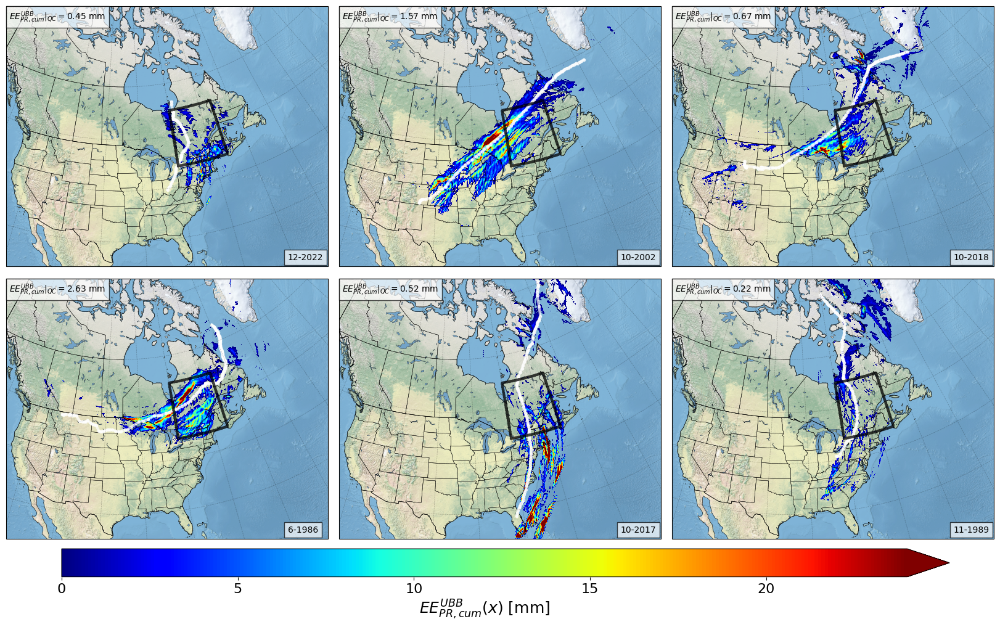

In [20]:
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 13))
axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, ax in tqdm(enumerate(axes)):    
    
    max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_rank[i])
    
    min_pressure_row = max_EETC.loc[max_EETC['pressure'].idxmin()]
    EETC_dict[sorted_EETC_cum_rank[i]]['min_pressure_date'] = min_pressure_row['date']
    
    month_years = max_EETC['date'].dt.to_period('M').unique()
    filenames = []
    for period in month_years:
        year = period.year
        month = period.month
        filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR/pr_{sim.lower()}_{year}{month:02d}_se.nc'))
    ds = xr.open_mfdataset(filenames)
    ds['time'] = ds['time'].dt.floor('h') #round pour wind
    ds['pr'] = ds.pr * 3600.
    mask_diff_precip = ds - percentile_precip
    mask_diff_precip = mask_diff_precip.where(mask_diff_precip >= 0, np.nan)
    mask_diff_precip = mask_diff_precip.compute()
    
    iEETC_list_precip = []
    for itrack, row in max_EETC.iterrows():        
        ilon, ilat, itime = row['lon'], row['lat'], row['date']

        mask_itime_precip = mask_diff_precip.sel(time=itime).where(mask_diff_precip.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).pr
        
        iEETC_list_precip.append(mask_itime_precip.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

    iEETC_precip = xr.concat(iEETC_list_precip, dim='time') 
    iEETC_precip_exc = iEETC_precip.sum(dim=['time']) 

    ax.set_extent([-120, -50, 70, 25], crs=ccrs.PlateCarree())

    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    # mtl_lon, mtl_lat = -73.561668, 45.508888
    # ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

    vmin = 0
    vmax = 24
    cmap = plt.get_cmap('jet')

    ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=3)

    iEETC_precip_exc = iEETC_precip_exc.where(iEETC_precip_exc > 0, np.nan)

    # sc = ax.contourf(iEETC_precip_exc['longitude'], iEETC_precip_exc['latitude'],
    #                  iEETC_precip_exc.sel(quantile=0.999), levels=np.linspace(vmin, vmax, int((vmax-vmin)/2)+1), extend='max', cmap=cmap, transform=ccrs.PlateCarree())
    
    sc = ax.pcolormesh(iEETC_precip_exc['rlon'], iEETC_precip_exc['rlat'],
                 iEETC_precip_exc.sel(quantile=quantile), vmin=vmin, vmax=vmax, cmap=cmap, transform=polecrs)

    ax.contour(
        Mask_NNA['rlon'],
        Mask_NNA['rlat'],
        Mask_NNA,
        levels=[0.99],
        linewidths=3,
        colors='black',
        alpha=0.75,
        transform=polecrs,
    )
    
    ax.text(
        0.01, 0.985,
        r"$EE_{PR,cum}^{UBB}|_{QC} = $"f"{np.round(EETC_dict[sorted_EETC_cum_rank[i]]['cum_precip'].sel(quantile=quantile).values.item(), 2)} mm",
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
    )
    
    ax.text(
        0.875, 0.05,
        f"{EETC_dict[sorted_EETC_cum_rank[i]]['min_pressure_date'].month}-{EETC_dict[sorted_EETC_cum_rank[i]]['min_pressure_date'].year}",
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
    )        
        
cbar_ax = fig.add_axes([0.1, 0.15, 0.8, 0.035])  # [left, bottom, width, height]    
# cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, ticks=range(vmin, vmax+1, 4))
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
# cbar.set_label('Precipitation exceedance (mm)', fontsize=15)
cbar.set_label(r'$EE_{PR,cum}^{UBB}(x)$ [mm]', fontsize=18)
cbar.ax.tick_params(labelsize=16)

# fig.suptitle(
#     'Precipitation exceedance (99th percentile) of the 6 most severe ETC of 1979-2023 in Québec\n'
#     'based on the cumulative ranking of $ETC_{PR, cum}$ . $ETC_{WS, cum}$', 
#     fontsize=22, y=0.93
# )

## A partir de là, il faut faire des modifications, notamment le floor pour le WS

6it [14:59, 149.92s/it]


Text(0.5, 0.93, 'UBF precipitation exceedance (99th percentile) of the 6 most severe ETC of 1979-2014 in Québec\nbased on the cumulative ranking of $ETC_{{PR, cum}}$ . $ETC_{{WS, cum}}$')

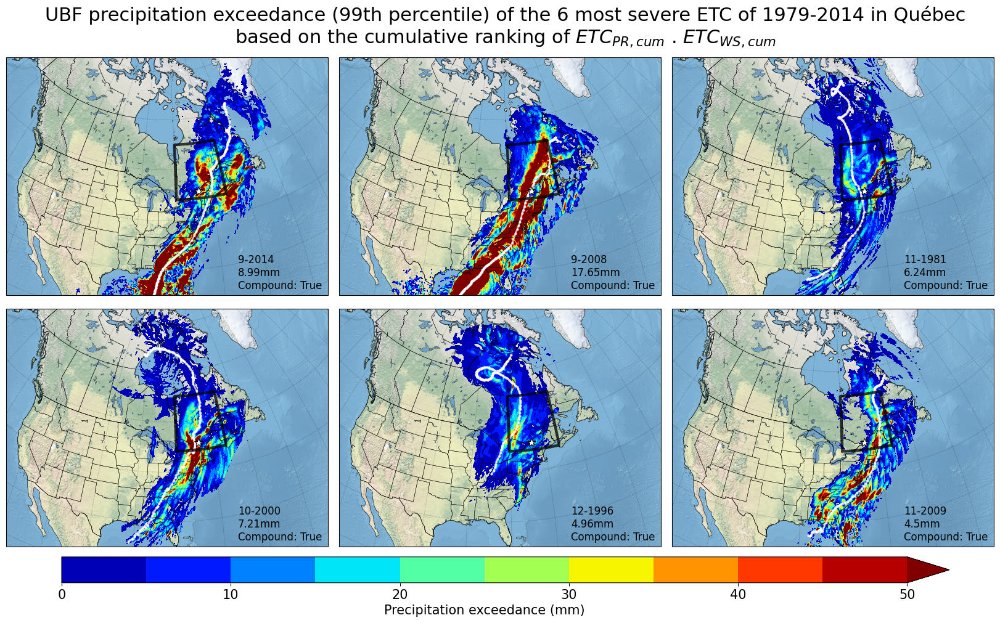

In [12]:
#Precip ranking cum
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 12))
axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, ax in tqdm(enumerate(axes)):    
    
    max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_rank[i])
    
    month_years = max_EETC['date'].dt.to_period('M').unique()
    filenames = []
    for period in month_years:
        year = period.year
        month = period.month
        filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR/pr_{sim.lower()}_{year}{month:02d}_se.nc'))
    ds = xr.open_mfdataset(filenames)
    ds['time'] = ds['time'].dt.floor('h')
    ds['pr'] = ds.pr * 3600.
    mask_diff_precip = ds - percentile_precip
    mask_diff_precip = mask_diff_precip.where(mask_diff_precip >= 0, np.nan)
    
    iEETC_list_precip = []
    for itrack, row in max_EETC.iterrows():        
        ilon, ilat, itime = row['lon'], row['lat'], row['date']

        mask_itime_precip = mask_diff_precip.sel(time=itime).where(mask_diff_precip.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).pr
        
        iEETC_list_precip.append(mask_itime_precip.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

    iEETC_precip = xr.concat(iEETC_list_precip, dim='time') 
    iEETC_precip_exc = iEETC_precip.sum(dim=['time']) 

    ax.set_extent([-120, -45, 70, 25], crs=ccrs.PlateCarree())

    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    mtl_lon, mtl_lat = -73.561668, 45.508888
    ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

    vmin = 0
    vmax = 50
    cmap = plt.get_cmap('jet')

    ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=2, c='white', alpha=0.7, marker='o', markersize=2)

    iEETC_precip_exc = iEETC_precip_exc.where(iEETC_precip_exc > 0, np.nan)
            
    sc = ax.contourf(iEETC_precip_exc['rlon'], iEETC_precip_exc['rlat'],
                     iEETC_precip_exc.sel(quantile=0.99), levels=np.linspace(vmin, vmax, int((vmax-vmin)/5)+1), extend='max', cmap=cmap, transform=polecrs)
    
    ax.contour(
        Mask_NNA['rlon'],
        Mask_NNA['rlat'],
        Mask_NNA,
        levels=[0.99],
        linewidths=3,
        colors='black',
        alpha=0.75,
        transform=polecrs,
    )
    
    ax.text(0.72, 0.17,
        f"{EETC_cum_rank_min_pressure_dates[i].month}-{EETC_cum_rank_min_pressure_dates[i].year}\n"
        f"{np.round(EETC_dict[sorted_EETC_cum_rank[i]]['cum_precip'].sel(quantile=0.99).values.item(), 2)}mm\n"
        f"Compound: {EETC_dict[sorted_EETC_cum_rank[i]]['compound_8hrs_quantile']['99']}",
        transform=ax.transAxes, fontsize=12, verticalalignment='top')
        
cbar_ax = fig.add_axes([0.1, 0.15, 0.8, 0.035])  # [left, bottom, width, height]    
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, ticks=range(vmin, vmax+1, 10))
cbar.set_label('Precipitation exceedance (mm)', fontsize=15)
cbar.ax.tick_params(labelsize=15)

fig.suptitle(
    f'{sim} precipitation exceedance (99th percentile) of the 6 most severe ETC of 1979-{endyear} in Québec\n'
    r'based on the cumulative ranking of $ETC_{{PR, cum}}$ . $ETC_{{WS, cum}}$', 
    fontsize=22, y=0.93
)

6it [15:19, 153.33s/it]


Text(0.5, 0.93, 'UBF surface wind exceedance (99th percentile) of the 6 most severe ETC of 1979-2023 in Québec\nbased on the cumulative ranking of $ETC_{{PR, cum}}$ . $ETC_{{WS, cum}}$')

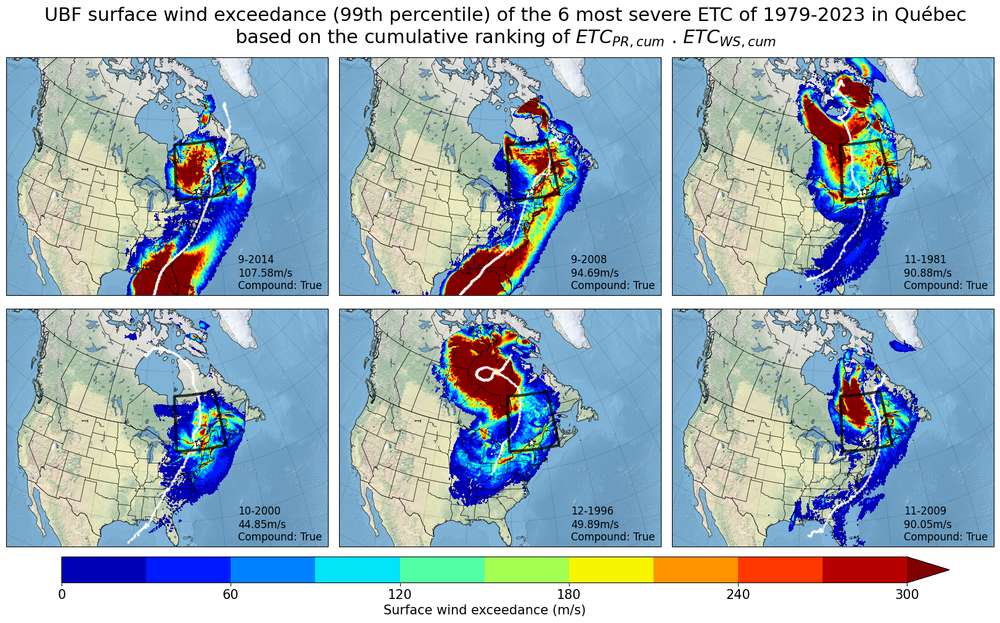

In [13]:
#Wind ranking cum
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 12))
axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, ax in tqdm(enumerate(axes)):    
    
    max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_rank[i])
      
    month_years = max_EETC['date'].dt.to_period('M').unique()
    filenames = []
    for period in month_years:
        year = period.year
        month = period.month
        filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND/wind10_{sim.lower()}_{year}{month:02d}_se.nc'))
    ds = xr.open_mfdataset(filenames)
    ds['time'] = ds['time'].dt.round('h')
    ds['surf_wind'] = ds.surf_wind * 3.6
    mask_diff_wind = ds - percentile_wind
    mask_diff_wind = mask_diff_wind.where(mask_diff_wind >= 0, np.nan)
    
    iEETC_list_wind = []
    for itrack, row in max_EETC.iterrows():        
        ilon, ilat, itime = row['lon'], row['lat'], row['date']

        mask_itime_wind = mask_diff_wind.sel(time=itime).where(mask_diff_wind.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).surf_wind
        
        iEETC_list_wind.append(mask_itime_wind.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

    iEETC_wind = xr.concat(iEETC_list_wind, dim='time') 
    iEETC_wind_exc = iEETC_wind.sum(dim=['time']) 

    ax.set_extent([-120, -45, 70, 25], crs=ccrs.PlateCarree())

    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    mtl_lon, mtl_lat = -73.561668, 45.508888
    ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

    vmin = 0
    vmax = 300
    cmap = plt.get_cmap('jet')

    ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=2, c='white', alpha=0.7, marker='o', markersize=2)

    iEETC_wind_exc = iEETC_wind_exc.where(iEETC_wind_exc > 0, np.nan)
    
    sc = ax.contourf(iEETC_wind_exc['rlon'], iEETC_wind_exc['rlat'],
                     iEETC_wind_exc.sel(quantile=0.99), levels=np.linspace(vmin, vmax, int((vmax-vmin)/30)+1), extend='max', cmap=cmap, transform=polecrs)
    
    ax.contour(
        Mask_NNA['rlon'],
        Mask_NNA['rlat'],
        Mask_NNA,
        levels=[0.99],
        linewidths=3,
        colors='black',
        alpha=0.75,
        transform=polecrs,
    )
    
    ax.text(0.72, 0.17,
        f"{EETC_cum_rank_min_pressure_dates[i].month}-{EETC_cum_rank_min_pressure_dates[i].year}\n"
        f"{np.round(EETC_dict[sorted_EETC_cum_rank[i]]['cum_wind'].sel(quantile=0.99).values.item(), 2)}m/s\n"
        f"Compound: {EETC_dict[sorted_EETC_cum_rank[i]]['compound_8hrs_quantile']['99']}",
        transform=ax.transAxes, fontsize=12, verticalalignment='top')
        
cbar_ax = fig.add_axes([0.1, 0.15, 0.8, 0.035])  # [left, bottom, width, height]    
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, ticks=range(vmin, vmax+1, 60))
cbar.set_label('Surface wind exceedance (m/s)', fontsize=15)
cbar.ax.tick_params(labelsize=15)

fig.suptitle(
    f'{sim} surface wind exceedance (99th percentile) of the 6 most severe ETC of 1979-2023 in Québec\n'
    'based on the cumulative ranking of $ETC_{{PR, cum}}$ . $ETC_{{WS, cum}}$', 
    fontsize=22, y=0.93
)

6it [23:37, 236.18s/it]


Text(0.5, 0.93, 'UBF precipitation exceedance (99th percentile) of the 6 most severe ETC of 1979-2014 in Québec\nbased on the cumulative ranking of $\\overline{{ETC}_{PR}}$ . $\\overline{{ETC}_{WS}}$')

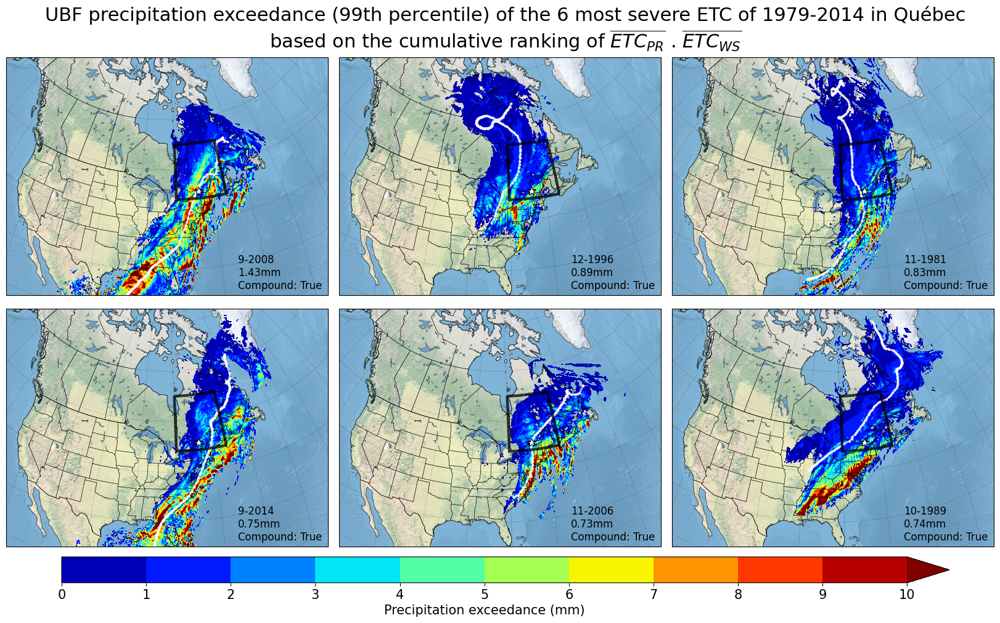

In [14]:
#Precip ranking cum_avg
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 12))
axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, ax in tqdm(enumerate(axes)):    
    
    max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_avg_rank[i])
    
    month_years = max_EETC['date'].dt.to_period('M').unique()
    filenames = []
    for period in month_years:
        year = period.year
        month = period.month
        filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR/pr_{sim.lower()}_{year}{month:02d}_se.nc'))
    ds = xr.open_mfdataset(filenames)
    ds['time'] = ds['time'].dt.floor('h')
    ds['pr'] = ds.pr * 3600.
    mask_diff_precip = ds - percentile_precip
    mask_diff_precip = mask_diff_precip.where(mask_diff_precip >= 0, np.nan)
    
    iEETC_list_precip = []
    for itrack, row in max_EETC.iterrows():        
        ilon, ilat, itime = row['lon'], row['lat'], row['date']

        mask_itime_precip = mask_diff_precip.sel(time=itime).where(mask_diff_precip.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).pr
        
        iEETC_list_precip.append(mask_itime_precip.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

    iEETC_precip = xr.concat(iEETC_list_precip, dim='time') 
    iEETC_precip_exc = iEETC_precip.sum(dim=['time'])
    iEETC_precip_dur = iEETC_precip.where(iEETC_precip > 0).count(dim='time')
    iEETC_precip_avexc = iEETC_precip_exc / iEETC_precip_dur.where(iEETC_precip_dur != 0)

    ax.set_extent([-120, -45, 70, 25], crs=ccrs.PlateCarree())

    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    mtl_lon, mtl_lat = -73.561668, 45.508888
    ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

    vmin = 0
    vmax = 10
    cmap = plt.get_cmap('jet')

    ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=2, c='white', alpha=0.7, marker='o', markersize=2)

    iEETC_precip_avexc = iEETC_precip_avexc.where(iEETC_precip_avexc > 0, np.nan)

    sc = ax.contourf(iEETC_precip_avexc['rlon'], iEETC_precip_avexc['rlat'],
                     iEETC_precip_avexc.sel(quantile=0.99), levels=np.linspace(vmin, vmax, int((vmax-vmin)*1)+1), extend='max', cmap=cmap, transform=polecrs)
    
    ax.contour(
        Mask_NNA['rlon'],
        Mask_NNA['rlat'],
        Mask_NNA,
        levels=[0.99],
        linewidths=3,
        colors='black',
        alpha=0.75,
        transform=polecrs,
    )
    
    ax.text(0.72, 0.17,
        f"{EETC_cum_avg_rank_min_pressure_dates[i].month}-{EETC_cum_avg_rank_min_pressure_dates[i].year}\n"
        f"{np.round(EETC_dict[sorted_EETC_cum_avg_rank[i]]['cum_avg_precip'].sel(quantile=0.99).values.item(), 2)}mm\n"
        f"Compound: {EETC_dict[sorted_EETC_cum_avg_rank[i]]['compound_8hrs_quantile']['99']}",
        transform=ax.transAxes, fontsize=12, verticalalignment='top')
        
cbar_ax = fig.add_axes([0.1, 0.15, 0.8, 0.035])  # [left, bottom, width, height]    
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, ticks=range(vmin, vmax+1, 1))
cbar.set_label('Precipitation exceedance (mm)', fontsize=15)
cbar.ax.tick_params(labelsize=15)

fig.suptitle(
    f'{sim} precipitation exceedance (99th percentile) of the 6 most severe ETC of 1979-{endyear} in Québec\n'
    'based on the cumulative ranking of $\overline{{ETC}_{PR}}$ . $\overline{{ETC}_{WS}}$', 
    fontsize=22, y=0.93
)

6it [25:17, 252.97s/it]


Text(0.5, 0.93, 'UBF surface wind exceedance (99th percentile) of the 6 most severe ETC of 1979-2023 in Québec\nbased on the cumulative ranking of $\\overline{{ETC}_{PR}}$ . $\\overline{{ETC}_{WS}}$')

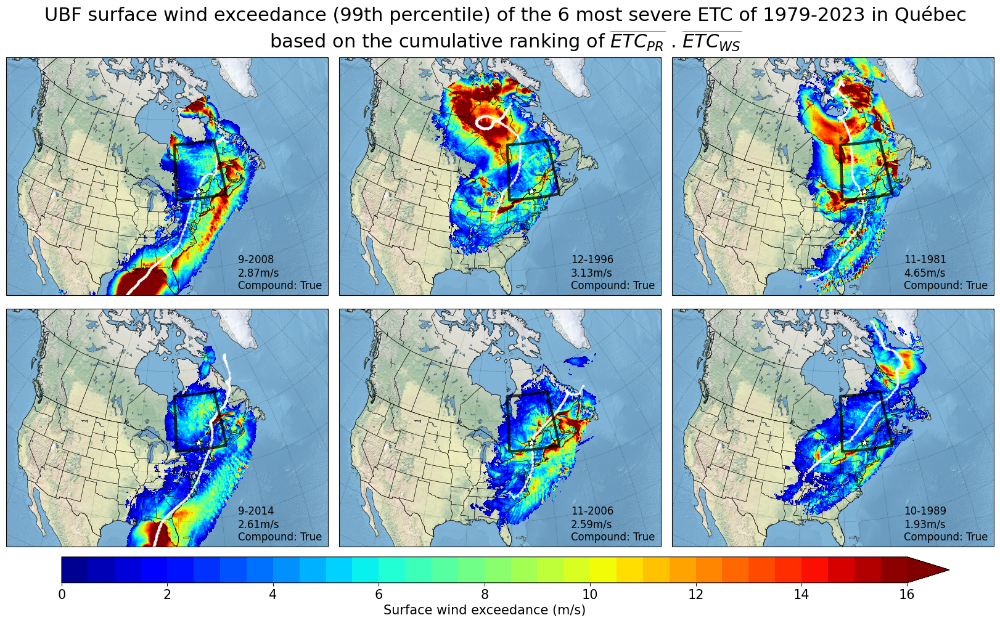

In [15]:
#Wind ranking cum_avg
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
fig = plt.figure(figsize=(18, 12))
axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

for i, ax in tqdm(enumerate(axes)):    
    
    max_EETC = df.groupby('storm').get_group(sorted_EETC_cum_avg_rank[i])
    
    month_years = max_EETC['date'].dt.to_period('M').unique()
    filenames = []
    for period in month_years:
        year = period.year
        month = period.month
        filenames.extend(braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND/wind10_{sim.lower()}_{year}{month:02d}_se.nc'))
    ds = xr.open_mfdataset(filenames)
    ds['time'] = ds['time'].dt.floor('h')
    ds['surf_wind'] = ds.surf_wind * 3.6
    mask_diff_wind = ds - percentile_wind
    mask_diff_wind = mask_diff_wind.where(mask_diff_wind >= 0, np.nan)
    
    iEETC_list_wind = []
    for itrack, row in max_EETC.iterrows():        
        ilon, ilat, itime = row['lon'], row['lat'], row['date']

        mask_itime_wind = mask_diff_wind.sel(time=itime).where(mask_diff_wind.sel(time=itime).map(lambda x: haversine(ilon, ilat, x.lon, x.lat) <= 1000), drop=True).surf_wind
        
        iEETC_list_wind.append(mask_itime_wind.chunk({'rlat': -1, 'rlon': -1, 'quantile': -1}))

    iEETC_wind = xr.concat(iEETC_list_wind, dim='time') 
    iEETC_wind_exc = iEETC_wind.sum(dim=['time'])
    iEETC_wind_dur = iEETC_wind.where(iEETC_wind > 0).count(dim='time')    
    iEETC_wind_avexc = iEETC_wind_exc / iEETC_wind_dur.where(iEETC_wind_dur != 0)

    ax.set_extent([-120, -45, 70, 25], crs=ccrs.PlateCarree())

    borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

    mtl_lon, mtl_lat = -73.561668, 45.508888
    ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

    vmin = 0
    vmax = 16
    cmap = plt.get_cmap('jet')

    ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=2, c='white', alpha=0.7, marker='o', markersize=2)

    iEETC_wind_avexc = iEETC_wind_avexc.where(iEETC_wind_avexc > 0, np.nan)

    sc = ax.contourf(iEETC_wind_avexc['rlon'], iEETC_wind_avexc['rlat'],
                     iEETC_wind_avexc.sel(quantile=0.99), levels=np.linspace(vmin, vmax, int((vmax-vmin)*2)+1), extend='max', cmap=cmap, transform=polecrs)
    
    ax.contour(
        Mask_NNA['rlon'],
        Mask_NNA['rlat'],
        Mask_NNA,
        levels=[0.99],
        linewidths=3,
        colors='black',
        alpha=0.75,
        transform=polecrs,
    )
    
    ax.text(0.72, 0.17,
        f"{EETC_cum_avg_rank_min_pressure_dates[i].month}-{EETC_cum_avg_rank_min_pressure_dates[i].year}\n"
        f"{np.round(EETC_dict[sorted_EETC_cum_avg_rank[i]]['cum_avg_wind'].sel(quantile=0.99).values.item(), 2)}m/s\n"
        f"Compound: {EETC_dict[sorted_EETC_cum_avg_rank[i]]['compound_8hrs_quantile']['99']}",
        transform=ax.transAxes, fontsize=12, verticalalignment='top')
        
cbar_ax = fig.add_axes([0.1, 0.15, 0.8, 0.035])  # [left, bottom, width, height]    
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, ticks=range(vmin, vmax+1, 2))
cbar.set_label('Surface wind exceedance (m/s)', fontsize=15)
cbar.ax.tick_params(labelsize=15)

fig.suptitle(
    f'{sim} surface wind exceedance (99th percentile) of the 6 most severe ETC of 1979-2023 in Québec\n'
    'based on the cumulative ranking of $\overline{{ETC}_{PR}}$ . $\overline{{ETC}_{WS}}$', 
    fontsize=22, y=0.93
)

## Cellule de test pour le tracé des cartes

In [16]:
# #For test purposes

# plotcrs = ccrs.Orthographic(-83, 45)
# fig = plt.figure(figsize=(18, 12))
# positions = [
#     [0.05, 0.45, 0.29, 0.50],  # Rangée du haut, Colonne 1
#     [0.35, 0.45, 0.29, 0.50],  # Rangée du haut, Colonne 2
#     [0.65, 0.45, 0.29, 0.50],  # Rangée du haut, Colonne 3
#     [0.05, 0.11, 0.29, 0.50],  # Rangée du bas, Colonne 1
#     [0.35, 0.11, 0.29, 0.50],  # Rangée du bas, Colonne 2
#     [0.65, 0.11, 0.29, 0.50],  # Rangée du bas, Colonne 3
# ]

# axes = [fig.add_axes(pos, projection=plotcrs) for pos in positions]

# for i, ax in tqdm(enumerate(axes)):

#     ax.set_extent([-120, -45, 70, 25], crs=ccrs.PlateCarree())

#     ax.coastlines(resolution='10m', linewidth=0.4, color='black')
#     mtl_lon, mtl_lat = -73.561668, 45.508888
#     ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=0.75, markeredgecolor='black', 
#             zorder=3, transform=ccrs.PlateCarree())

#     ax.plot(max_EETC['lon'], max_EETC['lat'], transform=ccrs.PlateCarree(), lw=2, c='black', alpha=0.7, marker='o', markersize=2)

#     ax.contour(
#         Mask_NNA['longitude'],
#         Mask_NNA['latitude'],
#         Mask_NNA,
#         levels=[0.99],
#         linewidths=3,
#         colors='black',
#         alpha=0.75,
#         transform=ccrs.PlateCarree(),
#     )

#     ax.text(0.72, 0.17,
#         f"{EETC_cum_wind_precip_product_min_pressure_dates[i].month}-{EETC_cum_wind_precip_product_min_pressure_dates[i].year}\n"
#         f"{np.round(EETC_dict[sorted_EETC_cum_wind_precip_product[i]]['cum_wind'].sel(quantile=0.99).values.item(), 2)}mm\n"
#         f"Compound: {EETC_dict[sorted_EETC_cum_wind_precip_product[i]]['compound_8hrs']['99']}",
#         transform=ax.transAxes, fontsize=12, verticalalignment='top')

# cbar_ax = fig.add_axes([0.1, 0.15, 0.8, 0.035])  # [left, bottom, width, height]
# cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal", pad=0.02, ticks=range(vmin, vmax+1, 10))
# cbar.set_label('Precipitation exceedance (mm)', fontsize=15)
# cbar.ax.tick_params(labelsize=15)

# fig.suptitle(
#     'Precipitation exceedance vs 99th percentile of the 6 most severe ETC of 1979-2023 in Québec\n'
#     'based on the product $ETC_{precip, cum}$ . $ETC_{wind, cum}$', 
#     fontsize=22, y=0.93  # Remonte le titre si besoin
# )